# Figure 4: MOSTA

Draw the mouse-embryo populations, interaction maps, cartilage-lineage
transitions and velocity fields shown in Figure 4.

Run this notebook from the [source checkout](../../installation.md).
The first cell downloads the cell-state inputs if needed. The smaller lineage,
communication and velocity arrays are included with the code.
The [MOSTA analysis tutorial](../dataset_workflows/mosta.ipynb) starts with the
trained model and shows how to generate populations and evaluate growth.

Panels a and b retain the paper's frame and label layout. Their cell layers
are regenerated from coordinates and interaction scores. The remaining panels
are drawn from lineage and velocity arrays.

In [1]:
import os
from pathlib import Path

import CytoBridge as cb
from IPython.display import Image, display

project = Path(os.environ.get("CYTOBRIDGE_PROJECT_DIR", ".")).resolve()
data = project / "data/mosta/paper"
if not (data / "figure4a/slice_data/time_0.h5ad").is_file():
    cb.datasets.download("mosta", destination=project,
                         kind="mosta_figure_data.zip")
output = Path("outputs/mosta_paper")
output.mkdir(parents=True, exist_ok=True)

def show(paths):
    for path in paths:
        if Path(path).suffix == ".png":
            display(Image(filename=str(path), width=850))

In [2]:
from reproduction.mosta.main_figure import draw_main_figure

## a. Spatial populations

Plot the four observed populations and the three generated intermediate populations with the paper’s cell-type colours.

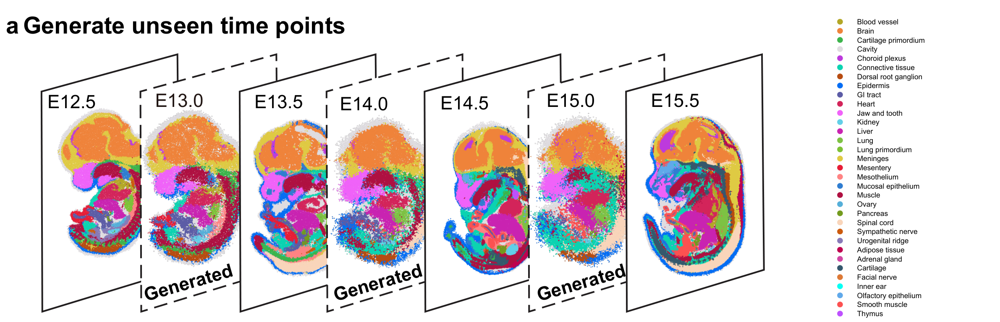

In [3]:
figures = draw_main_figure(data, output, panels="a")
show(figures["a"])

## b. Interaction maps

Calculate the colour range separately at each time from the 1st and 99th percentiles of the interaction scores, then draw the three spatial maps.

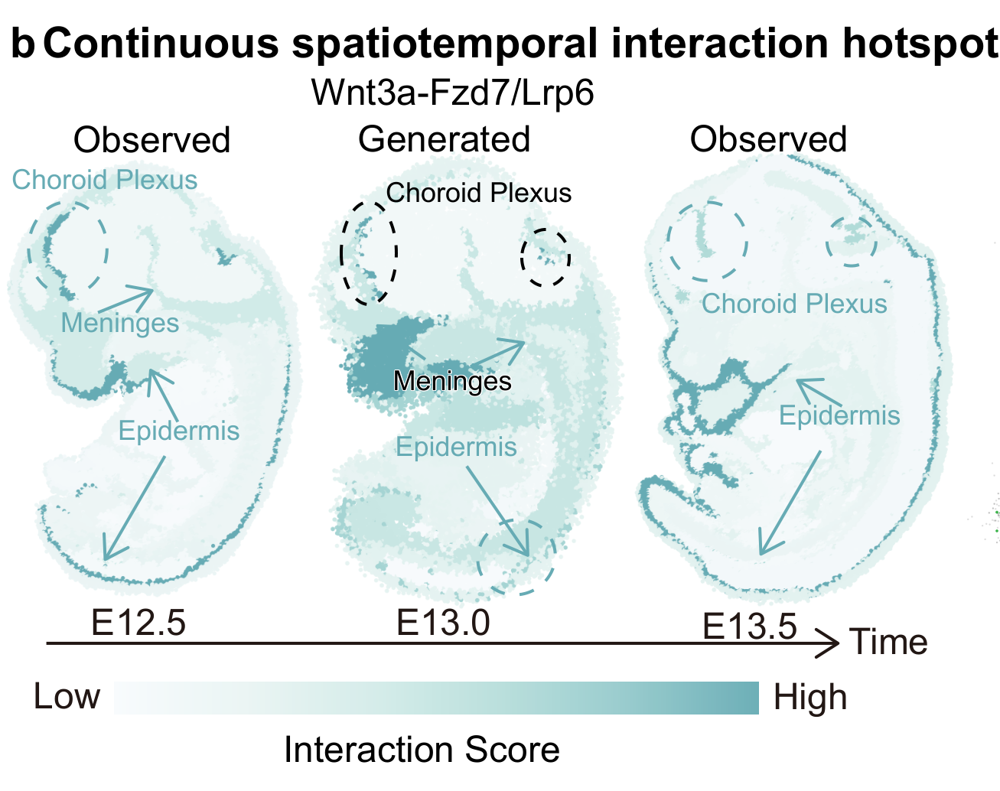

In [4]:
figures = draw_main_figure(data, output, panels="b")
show(figures["b"])

## c. Cartilage lineage

Count the destination labels of the simulated cartilage-primordium cells. Draw the three largest transitions and calculate their percentages.

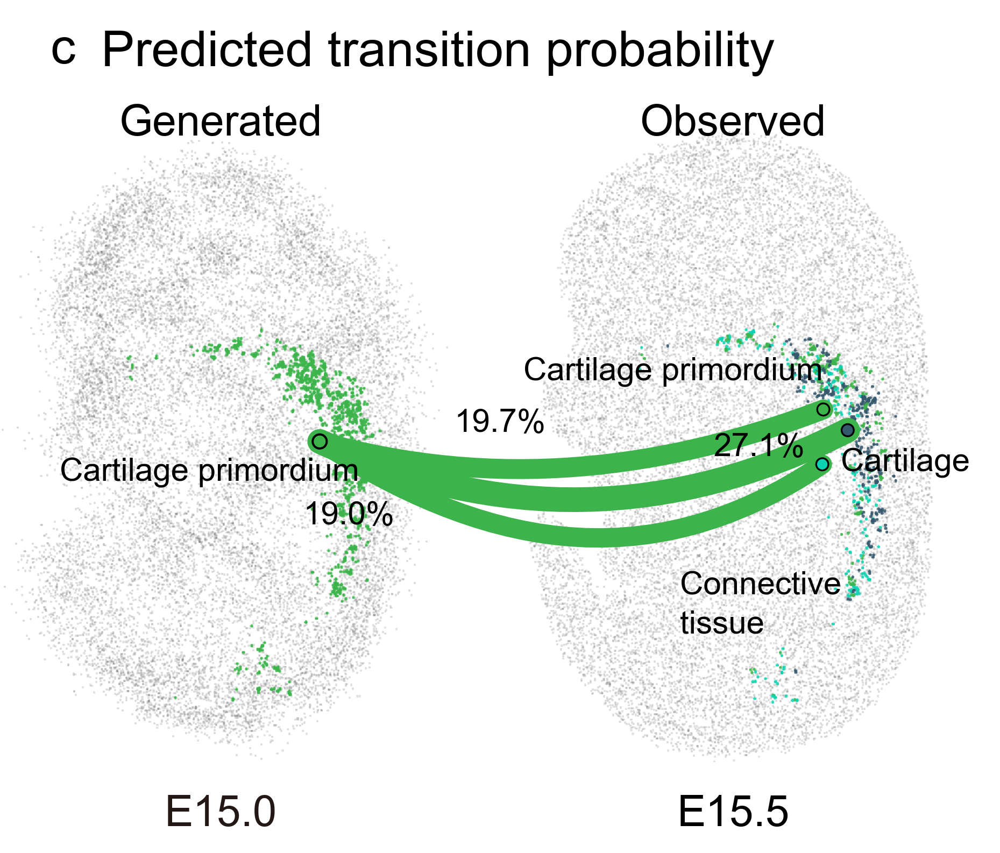

In [5]:
figures = draw_main_figure(data, output, panels="c")
show(figures["c"])

## d. Interaction-induced gene velocity

Draw the projected gene-velocity streamlines and communication arrows. Arrow widths use the saved cell-type communication scores.

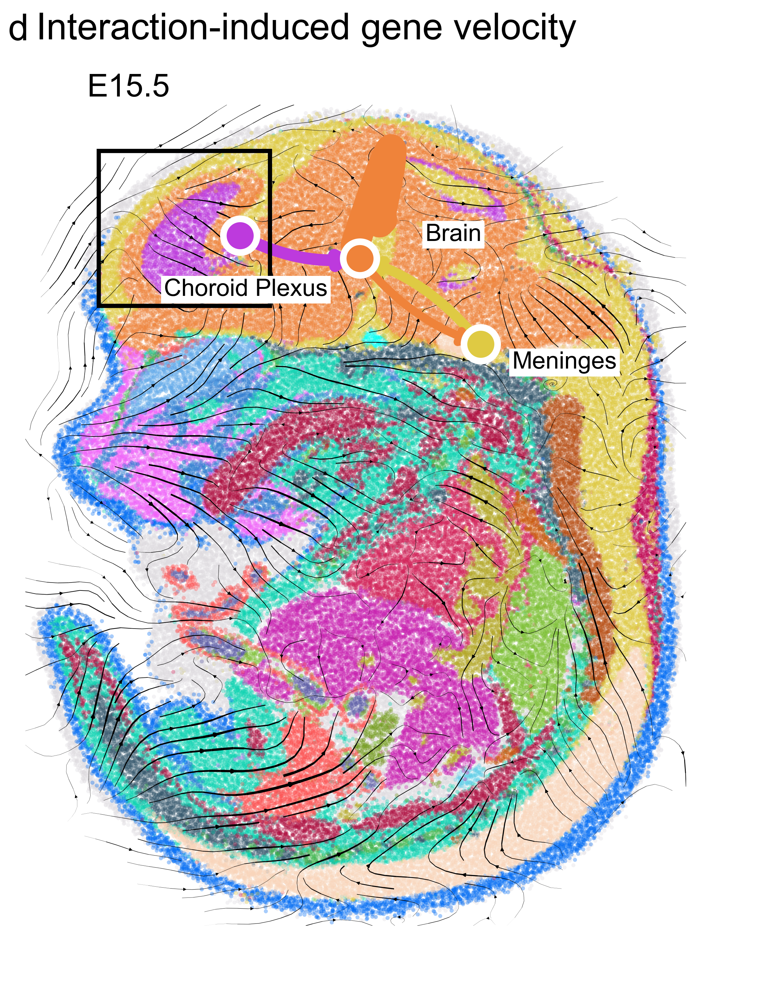

In [6]:
figures = draw_main_figure(data, output, panels="d")
show(figures["d"])

## e. Brain velocity fields

Draw full and interaction velocity in gene and spatial coordinates for the selected brain region.

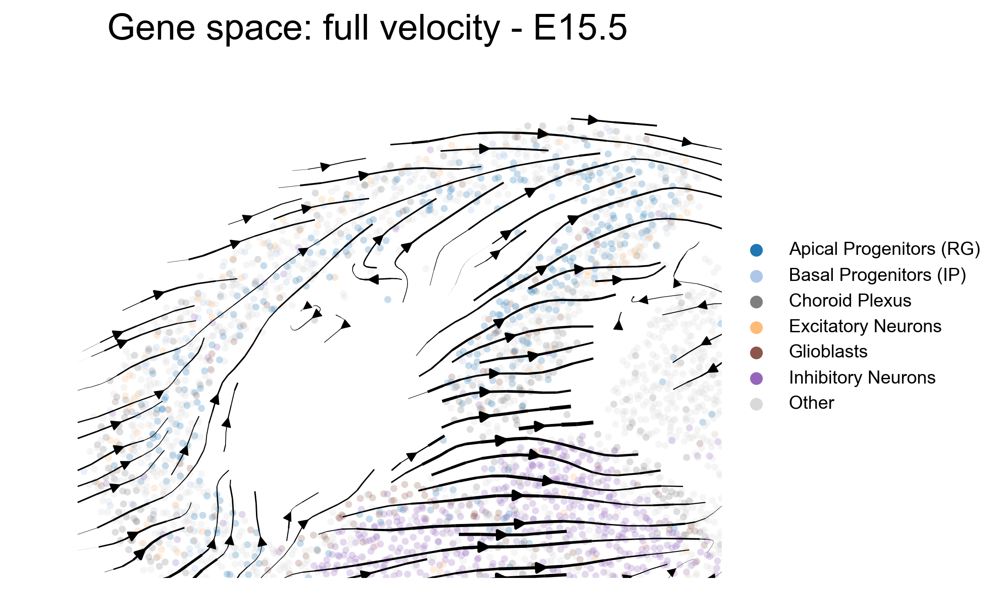

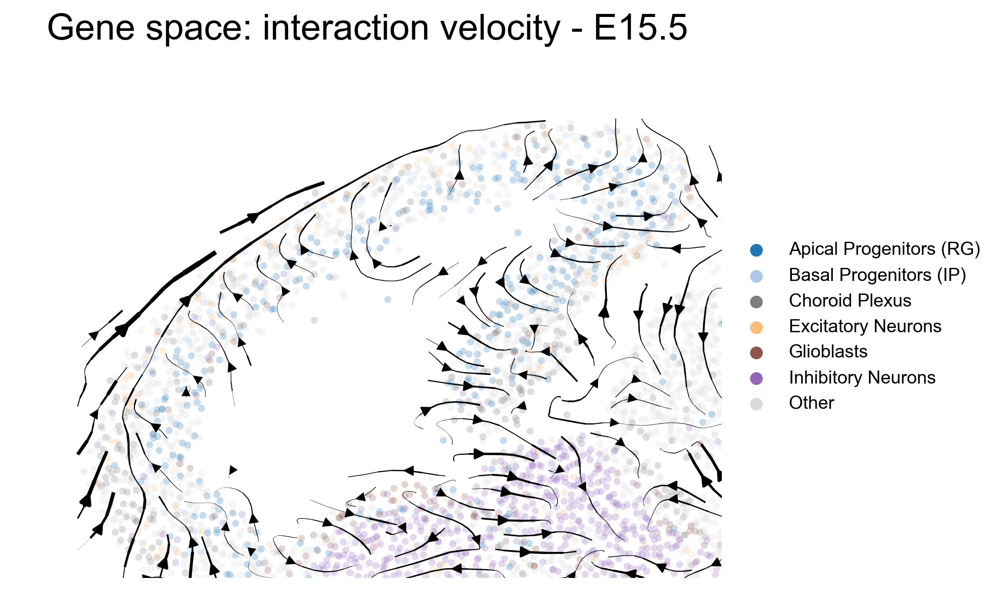

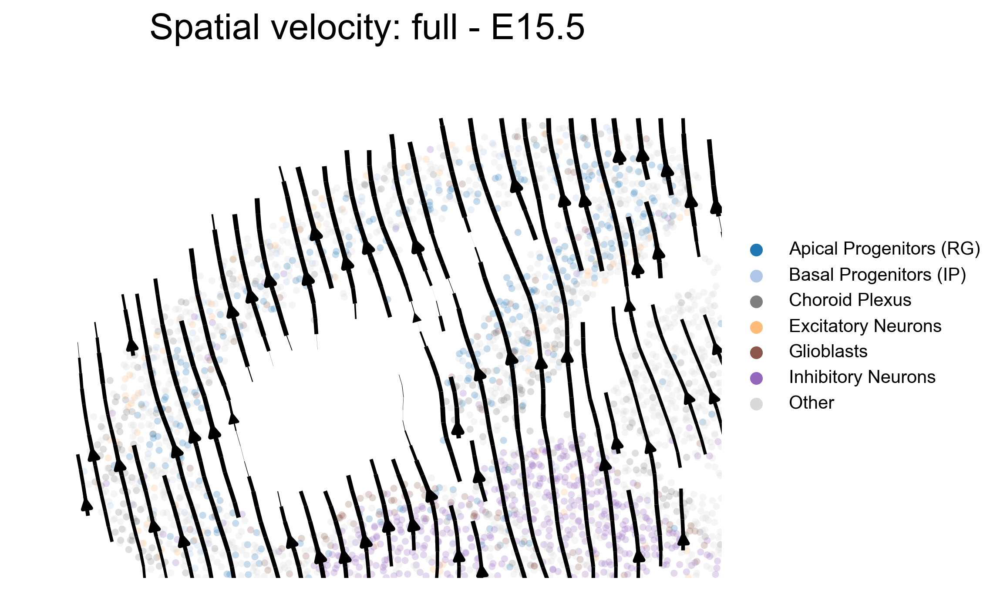

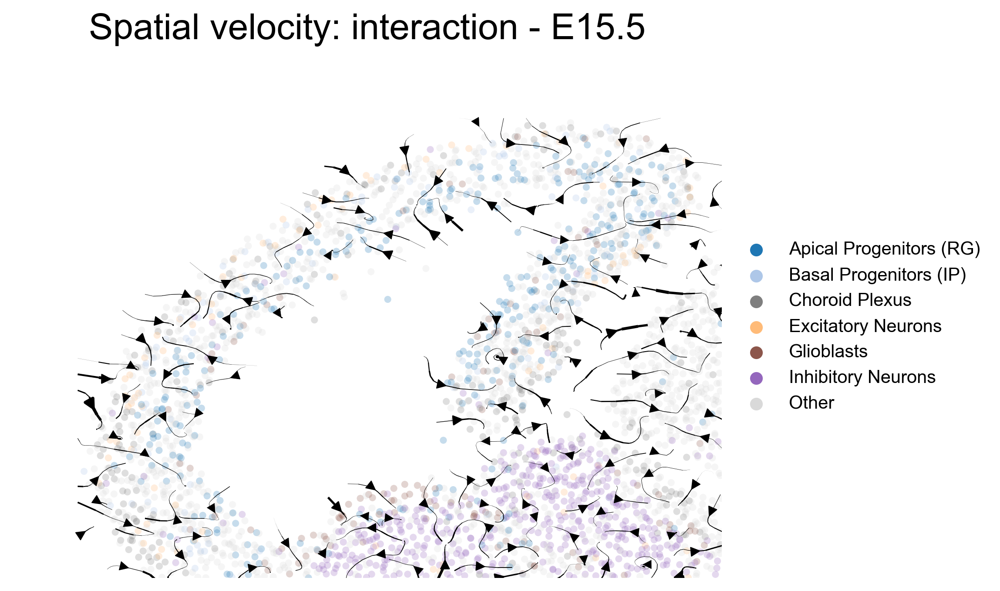

In [7]:
figures = draw_main_figure(data, output, panels="e")
show(figures["e"])